# Practical 1 : integrating single-cell and spatial analyses in python
In this practical, you will consecutively analyse single-cell (10X genomics chromium) and spatial transcriptomics (10X genomics Visium) from a pleural mesothelioma tumor.

We will focus on a single donor, patient 3B, a 80+ y.o. male without asbestos exposure on which 1 single-cell and 1 spatial sequencing were performed.

## Part II: spatial analyses and cell-cell communication

The data was already processed (see scripts in files/data/Practical1/S/scripts/), with QC and filtering of cells and features and normalization.    
Spatial deconvolution with a scRNA-seq reference was also performed with cell2location method. This step is too computationally demanding to include in this practical, but you can find a tutorial on spatial deconvolution here: https://www.sc-best-practices.org/spatial/deconvolution.html

In the second part of the practical, you will explore spatial expression patterns, determine spatial domains and infer significant cell-cell interactions from single-cell and spatial datasets.

For the analysys steps we will mostly use the squidpy package. Similarly to the scanpy module, squidpy has submodules gr for graph analyses (e.g., computing nearest neighbors and graph metrics), pl for plotting functions, and tl for tools, as well as im for image analyses. See documentation (https://squidpy.readthedocs.io/en/stable/api.html) for further details on functions and arguments.

### Loading modules

In [1]:
import squidpy as sq
#import matplotlib
#import cell2location as c2l
import scanpy as sc
import liana as li
import os

/home/yuliya.lim/.local/lib/python3.10/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/home/yuliya.lim/.local/lib/python3.10/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/home/yuliya.lim/.local/lib/python3.10/site-packages/anndata/utils.py:434: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


In [2]:
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80, facecolor="white")

### Loading data

In [5]:
# load spatial data with cell-type deconvolution 
#file_path = r"Z:\Training-MG\files\data\Practical1\ST\2025\sample3B_visium_deconvoluted.h5ad"
file_path_inuvika = r"/data/Training-MG/files/data/Practical1/ST/2025/sample3B_visium_deconvoluted.h5ad"
adata_st = sc.read(file_path_inuvika)

### Overview of the data  

1. Explore the loaded anndata object. How many spots and features (genes) it contains? Can you access raw and log-normalised counts? Where the deconvolution results are stored?

In [6]:
adata_st

AnnData object with n_obs × n_vars = 819 × 11813
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'cluster', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', '_indices', '_scvi_batch', '_scvi_labels', 'B cells', 'DC', 'ILC', 'Macrophages', 'Monocytes', 'T cells', 'pDC', 'epi/mesothelial', 'endothelial', 'stromal', 'tumor'
    var: 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_deviant', 'binomial_deviance', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'feature_name'
    uns: '_scvi_manager_uuid', '_scvi

In [7]:
adata_st  # 819 spots, 11813 genes

print("Raw counts:\n", adata_st.layers["counts"].todense())
print("Normalized counts:\n", adata_st.layers["log1p_norm"].todense())

Raw counts:
 [[ 0.  3.  2. ...  0.  2.  4.]
 [ 2.  5.  4. ...  0.  5.  5.]
 [ 0.  6.  5. ...  1. 12. 11.]
 ...
 [ 0.  5.  2. ...  0. 17. 22.]
 [ 0.  8.  2. ...  0. 12. 22.]
 [ 1.  8.  3. ...  0. 11.  7.]]
Normalized counts:
 [[0.         0.5992724  0.436444   ... 0.         0.436444   0.73926294]
 [0.2126237  0.46517807 0.38787004 ... 0.         0.46517807 0.46517807]
 [0.         0.42708263 0.3674051  ... 0.08507299 0.7254007  0.68146014]
 ...
 [0.         0.32168624 0.14130923 ... 0.         0.82861143 0.98192436]
 [0.         0.5046723  0.1519574  ... 0.         0.68544954 1.0314809 ]
 [0.09071494 0.5651176  0.25065795 ... 0.         0.7151656  0.5096437 ]]


In [11]:
adata_st.obs.columns

Index(['in_tissue', 'array_row', 'array_col', 'sample', 'cluster',
       'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts',
       'log1p_total_counts', 'pct_counts_in_top_20_genes',
       'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes',
       'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes',
       'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt',
       'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo',
       'outlier', 'mt_outlier', '_indices', '_scvi_batch', '_scvi_labels',
       'B cells', 'DC', 'ILC', 'Macrophages', 'Monocytes', 'T cells', 'pDC',
       'epi/mesothelial', 'endothelial', 'stromal', 'tumor'],
      dtype='object')

2. Plot the QC metrics (number of genes expressed per spot, total number of counts per spot and the percentage of mitochondrial gene expression) for this dataset. You may use violin plot from scanpy. 

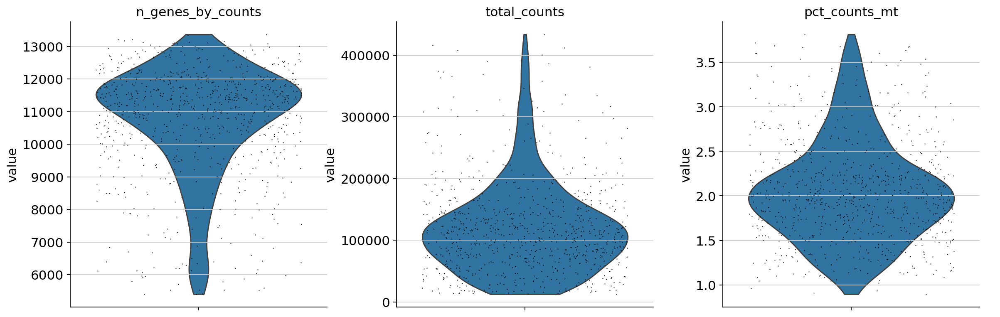

In [10]:
#violin plots of QC metrics
sc.pl.violin(
    adata_st,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

3. Visualize clusters (maybe not), number of genes expressed per spot and total number of counts per spot on a spatial plot using sq.pl.spatial_scatter(). Note the heterogeneity in gene expression over the Visium sample.

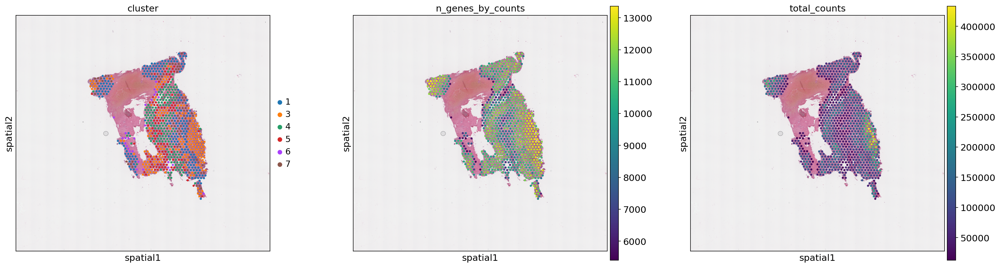

In [22]:
adata_st.obs["cluster"] = adata_st.obs["cluster"].astype("category")

sq.pl.spatial_scatter(adata_st, color=["cluster", "n_genes_by_counts", "total_counts"], figsize=(7, 7)) 

4. Visualize spatial expression of some of the highly variable genes. Do they present any spatial pattern?

In [18]:
adata_st.var[adata_st.var["highly_variable"]==True]

,feature_types,genome,mt,ribo,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,highly_deviant,binomial_deviance,highly_variable,means,dispersions,dispersions_norm,feature_name
gene_ids,,,,,,,,,,,,,,,,,
SAMD11,Gene Expression,GRCh38,False,False,341,0.479167,0.391479,69.112319,529.0,6.272877,False,1042.477551,True,0.058505,-1.685097,0.653102,ENSG00000187634
HES4,Gene Expression,GRCh38,False,False,766,3.347826,1.469676,30.615942,3696.0,8.215277,True,1765.817630,True,0.344955,-1.272853,1.248742,ENSG00000188290
ISG15,Gene Expression,GRCh38,False,False,979,59.069748,4.095506,11.322464,65213.0,11.085429,True,20622.878551,True,2.094329,0.872689,0.707606,ENSG00000187608
AGRN,Gene Expression,GRCh38,False,False,920,34.606884,3.572539,16.666667,38206.0,10.550774,True,6980.523696,True,1.496060,-0.261536,0.611271,ENSG00000188157
TNFRSF18,Gene Expression,GRCh38,False,False,500,0.939312,0.662333,54.710145,1037.0,6.945051,False,1293.700827,True,0.104648,-1.620864,0.862679,ENSG00000186891
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SLC6A8,Gene Expression,GRCh38,False,False,573,1.539855,0.932107,48.097826,1700.0,7.438972,True,2979.523016,True,0.174773,-0.610523,4.159208,ENSG00000130821
L1CAM,Gene Expression,GRCh38,False,False,348,0.589674,0.463529,68.478261,651.0,6.480044,False,1130.416225,True,0.063369,-1.646395,0.779379,ENSG00000198910
RENBP,Gene Expression,GRCh38,False,False,761,2.568841,1.272241,31.068841,2836.0,7.950502,True,1962.482496,True,0.296832,-1.386660,0.935854,ENSG00000102032


Index(['SRGN', 'IGKC', 'IGFBP3', 'TGFBI', 'SLPI', 'CFB', 'SLC39A8', 'PRG4',
       'CTSL', 'HBA2',
       ...
       'TREML4', 'EPCAM', 'WNT11', 'RBM34', 'HRC', 'TRH', 'F12', 'CXCL5',
       'IGHE', 'IGHA2'],
      dtype='object', name='gene_ids', length=2494)


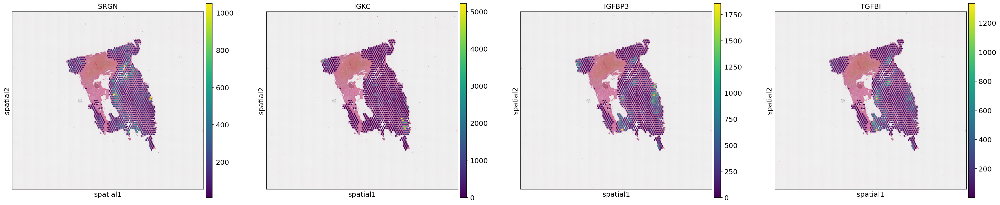

In [23]:
print(adata_st.var[adata_st.var["highly_variable"]==True].sort_values(by="means", ascending=False).index)

sq.pl.spatial_scatter(adata_st, color=["SRGN", "IGKC", "IGFBP3", "TGFBI"], figsize=(7, 7)) 

5. Visualize the proportions of different cell types on the spatial slide. 

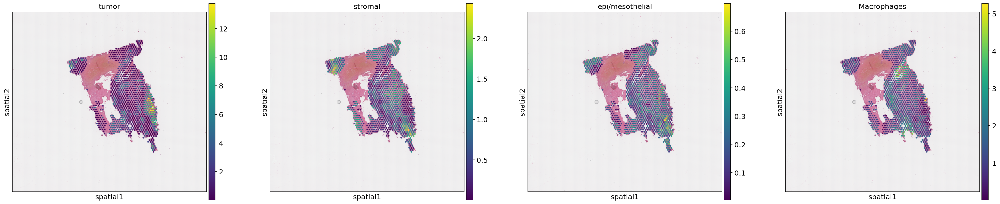

In [24]:
sq.pl.spatial_scatter(adata_st, color=["tumor", "stromal", "epi/mesothelial", "Macrophages"], figsize=(7, 7)) 

### Identifying spatial domains  

#### 1. Compute spatial proximity and gene expression proximity graphs. 

Q. Run the function neighbors() from scanpy and the function spatial_neighbors() from squidpy to create sperate graphs based on spot expression similarity and spatial proximity. 



In [14]:
adata_st

AnnData object with n_obs × n_vars = 819 × 11813
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'cluster', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', '_indices', '_scvi_batch', '_scvi_labels', 'B cells', 'DC', 'ILC', 'Macrophages', 'Monocytes', 'T cells', 'pDC', 'epi/mesothelial', 'endothelial', 'stromal', 'tumor'
    var: 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_deviant', 'binomial_deviance', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'feature_name'
    uns: '_scvi_manager_uuid', '_scvi

In [13]:
# compute expression proximity graph
sc.pp.neighbors(adata_st)
nn_graph_genes = adata_st.obsp["connectivities"]

# compute spatial proximity graph
sq.gr.spatial_neighbors(adata_st)
nn_graph_space = adata_st.obsp["spatial_connectivities"]


computing neighbors
computing PCA
    with n_comps=50


/home/yuliya.lim/.local/lib/python3.10/site-packages/scanpy/neighbors/__init__.py:577: UserWarning: You’re trying to run this on 11813 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.


    finished (0:00:00)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:10)
Creating graph using `grid` coordinates and `None` transform and `1` libraries.
Adding `adata.obsp['spatial_connectivities']`
       `adata.obsp['spatial_distances']`
       `adata.uns['spatial_neighbors']`
Finish (0:00:00)


Q: Identify domains with squidpy. Combine the two graphs, perform leiden clustering on the joint graph (sc.tl.leiden()), and plot the results using the spatial_scatter function from squidpy. 
Try changing the weight of the expression and spatial KNN graphs to see how they influence the results.

running Leiden clustering
    finished: found 9 clusters and added
    'squidpy_domains', the cluster labels (adata.obs, categorical) (0:00:00)


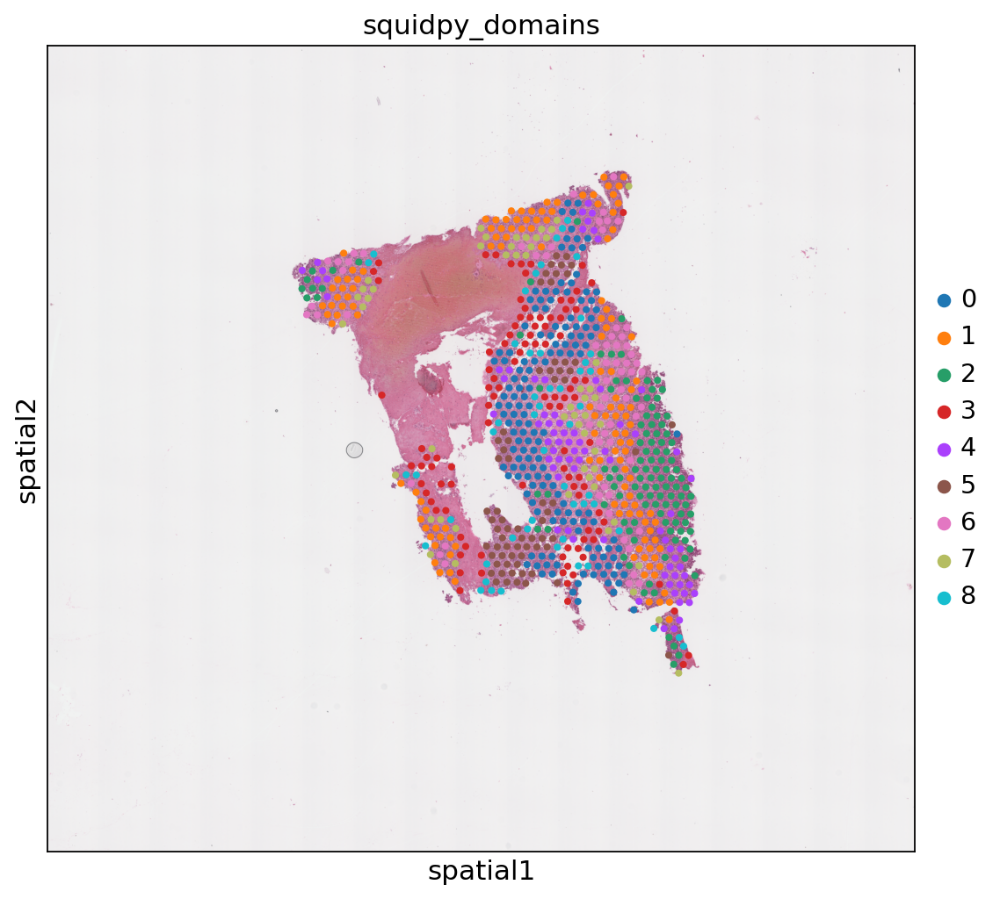

In [22]:
alpha = 0.5

joint_graph = (1 - alpha) * nn_graph_genes + alpha * nn_graph_space
sc.tl.leiden(adata_st, adjacency=joint_graph, key_added="squidpy_domains")
sq.pl.spatial_scatter(adata_st, color=["squidpy_domains"], wspace=0.9, figsize=(7,7))


In [21]:
adata_st.uns.pop('squidpy_domains_colors')  #run if you want to clean squidpy_domains

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896',
 '#c5b0d5',
 '#c49c94',
 '#f7b6d2',
 '#dbdb8d',
 '#9edae5',
 '#ad494a',
 '#8c6d31']

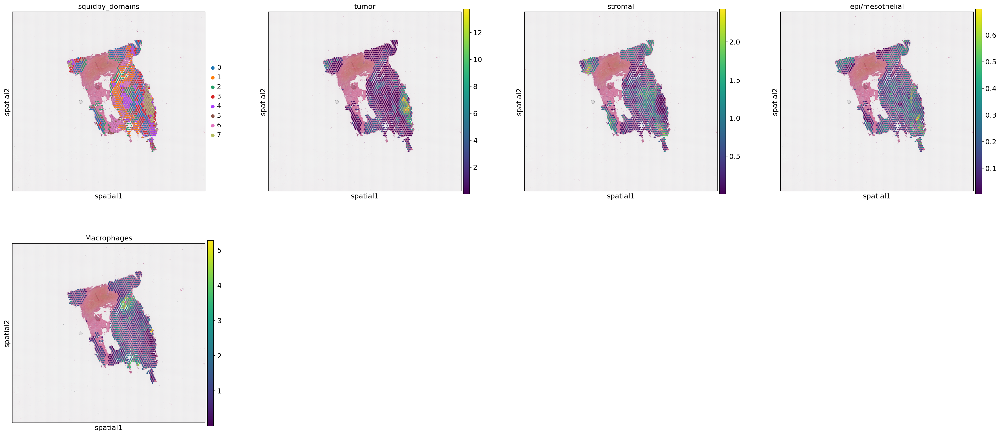

In [27]:
sq.pl.spatial_scatter(adata_st, color=["squidpy_domains", "tumor", "stromal", "epi/mesothelial", "Macrophages"], figsize=(7,7))


### Identifying spatially variable genes (SVGs)

4. Identify spatially variable genes using Moran's I statistic in graph module of squidpy: sq.gr.spatial_autocorr(). We will restrain the gene set only on highly variable genes.

In [28]:
# subset HVG 
HVG_names = adata_st[:,adata_st.var.highly_variable].var_names

sq.gr.spatial_neighbors(adata_st)
sq.gr.spatial_autocorr(adata_st, mode="moran", layer="log1p_norm", genes=HVG_names)

Creating graph using `grid` coordinates and `None` transform and `1` libraries.
Adding `adata.obsp['spatial_connectivities']`
       `adata.obsp['spatial_distances']`
       `adata.uns['spatial_neighbors']`
Finish (0:00:00)
Calculating moran's statistic for `None` permutations using `1` core(s)
Adding `adata.uns['moranI']`
Finish (0:00:00)


5. Print the results and plot spatial expression of the top SVGs. Compare with the top HVGs. 

In [29]:
adata_st.uns["moranI"].head()

,I,pval_norm,var_norm,pval_norm_fdr_bh
gene_ids,,,,
FOSB,0.835460,0.0,0.000483,0.0
CTSL,0.801376,0.0,0.000483,0.0
BGN,0.798245,0.0,0.000483,0.0
TGFBI,0.796537,0.0,0.000483,0.0
COL4A1,0.795359,0.0,0.000483,0.0


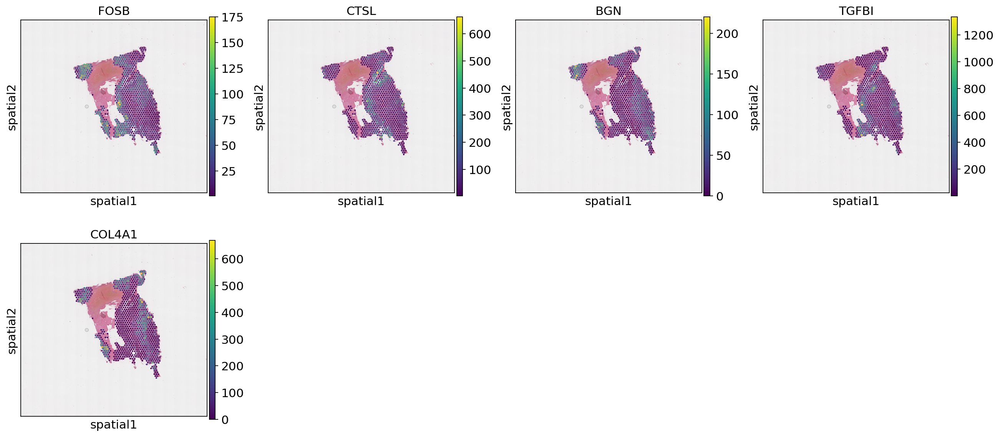

In [30]:
sq.pl.spatial_scatter(adata_st, color=["FOSB","CTSL", "BGN", "TGFBI", "COL4A1"])

Are they expressed in the same area? If so, probably you computed the Moran's I on the raw counts, and it just highlighed the area with the highest expression (see Question 3).  
It is recommended to use normalized counts to find the SVGs. You may need to recompute the Moran's I on the log-transformed data (stored in .layers) 

### Neighborhood analysis  

After identification of spatial domains we can quantify the spatial enrichment of the obtained clusters.  

Neighborhood enrichment quantifies how often two clusters occur near each other in space.
If cells or spots from one cluster are frequently located next to those from another cluster, the pair receives a high enrichment score, indicating spatial enrichment.
On the other hand, if the two clusters rarely appear as neighbors, they tend to be spatially separated — the enrichment score is low, indicating spatial depletion.

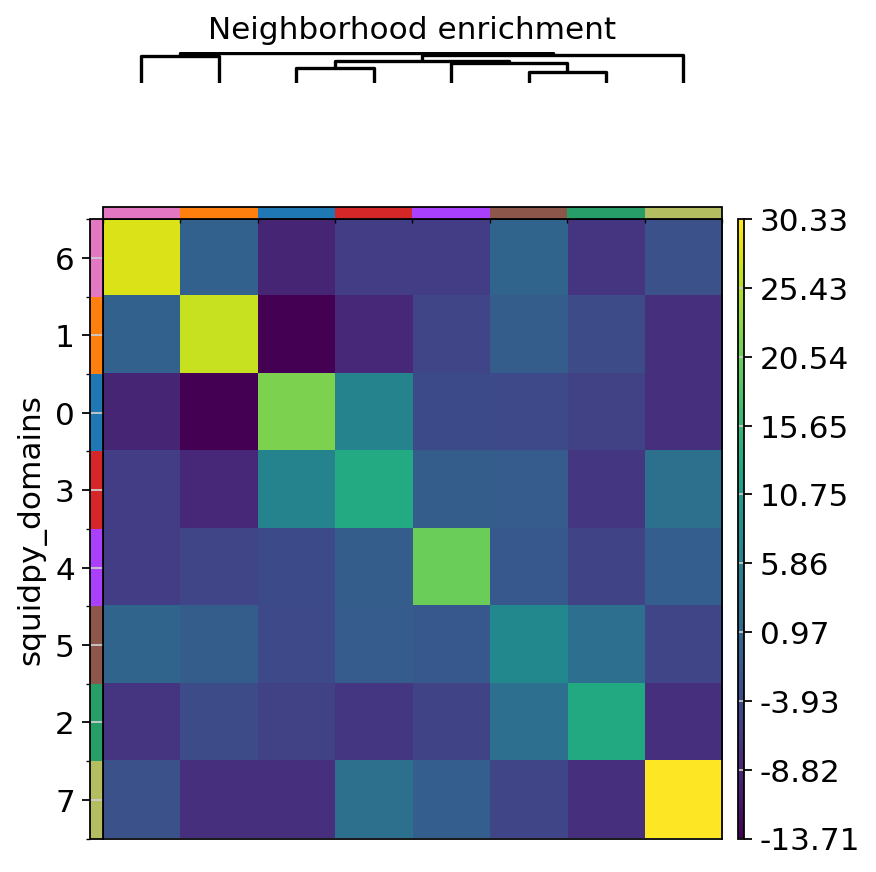

In [47]:
#sq.gr.spatial_neighbors(adata_st)
#sq.gr.nhood_enrichment(adata_st, cluster_key="squidpy_domains")
sq.pl.nhood_enrichment(adata_st, cluster_key="squidpy_domains", method="average", figsize=(5, 5))


### Cell-cell interaction inference

In this section, we will infer cell-cell interactions between cell types and spatial regions. We will start by using LIANA+ framework that combines various inference methods and LR ressources.  
See documentation and tutorials at https://liana-py.readthedocs.io/en/latest/api.html 

#### 1. CCI inference from annotated scRNA-seq data (dissociated cells). 

Q: Load the annotated single-cell data from the previous TP.

In [35]:
#dir_sc = r"Z:\Training-MG\files\data\Practical1\scRNAseq\2025\annotated\sample3B_annotation_level2.h5ad"
dir_sc_inuvika = r"/data/Training-MG/files/data/Practical1/scRNAseq/2025/annotated/sample3B_annotation_level2.h5ad"
adata_sc = sc.read(dir_sc_inuvika)

Cell–cell signalling is inferred between pairs of cell groups, defined as source and target populations of cells.  
To perform this analysis, you must provide annotations that assign each cell to one of these groups.  In single-cell datasets, these groups typically correspond to the identified cell types.

Q. Explore the loaded data. How many clls and features it has? Check the cell type annotations ("annotation_level2" column).

In [36]:
adata_sc

AnnData object with n_obs × n_vars = 8933 × 36601
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'is_outlier', 'sample', 'scDblFinder_score', 'scDblFinder_class', 'leiden_res0.05', 'leiden_res0.1', 'leiden_res0.15', 'leiden_res0.25', 'leiden_res0.5', 'leiden_res0.75', 'leiden_res1.0', 'predicted_labels_level1', 'annotation_level1', 'annotation_level1_conf_score', 'is_tumor', 'annotation_level2', 'annotation_level2_conf_score', 'annotation_BAP1', 'annotation_CDKN2_MTAP', 'annotation_TP53', 'annotation_NF2', 'annotation_EZH2'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total

In [37]:
adata_sc.obs["annotation_level2"]

AAACCCAAGATCCTAC-1        T cells
AAACCCAAGATGAATC-1          tumor
AAACCCAAGGCCACCT-1    endothelial
AAACCCAAGGTAGATT-1            ILC
AAACCCAAGTGCACCC-1          tumor
                         ...     
TTTGTTGTCAGTCTTT-1        T cells
TTTGTTGTCCAAACCA-1          tumor
TTTGTTGTCCTTATAC-1        T cells
TTTGTTGTCGACATAC-1          tumor
TTTGTTGTCGATCCCT-1          tumor
Name: annotation_level2, Length: 8933, dtype: category
Categories (13, object): ['B cells', 'DC', 'Endothelial cells', 'Epithelial cells', ..., 'epi/mesothelial', 'endothelial', 'stromal', 'tumor']

Q: Run rank_aggregated method from li.mt with "consensus" resource.

In [38]:
# methods available in liana
li.method.show_methods()


,Method Name,Magnitude Score,Specificity Score,Reference
0,CellPhoneDB,lr_means,cellphone_pvals,"Efremova, M., Vento-Tormo, M., Teichmann, S.A...."
0,Connectome,expr_prod,scaled_weight,"Raredon, M.S.B., Yang, J., Garritano, J., Wang..."
0,log2FC,None,lr_logfc,"Dimitrov, D., Türei, D., Garrido-Rodriguez, M...."
0,NATMI,expr_prod,spec_weight,"Hou, R., Denisenko, E., Ong, H.T., Ramilowski,..."
0,SingleCellSignalR,lrscore,None,"Cabello-Aguilar, S., Alame, M., Kon-Sun-Tack, ..."
0,Rank_Aggregate,magnitude_rank,specificity_rank,"Dimitrov, D., Türei, D., Garrido-Rodriguez, M...."
0,Geometric Mean,lr_gmeans,gmean_pvals,CellPhoneDBv2's permutation approach applied t...
0,scSeqComm,inter_score,None,"Baruzzo, G., Cesaro, G., Di Camillo, B. 2022. ..."
0,CellChat,lr_probs,cellchat_pvals,"Jin, S., Guerrero-Juarez, C.F., Zhang, L., Cha..."


In [39]:
# rank aggregate

li.mt.rank_aggregate(adata_sc,
                     groupby='annotation_level2',
                     use_raw = False,
                     layer = "log1p_norm",
                     resource_name='consensus',
                     expr_prop=0.1,
                     verbose=True)

Using resource `consensus`.
Using the `log1p_norm` layer!
/home/yuliya.lim/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:381: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
10142 features of mat are empty, they will be removed.
/home/yuliya.lim/miniconda3/envs/MG_sc_env/lib/python3.10/site-packages/liana/method/_pipe_utils/_pre.py:146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/home/yuliya.lim/miniconda3/envs/MG_sc_env/lib/python3.10/site-packages/liana/method/_pipe_utils/_pre.py:149: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
0.11 of entities in the resource are missing from the data.


Generating ligand-receptor stats for 8933 samples and 1649 features


/home/yuliya.lim/miniconda3/envs/MG_sc_env/lib/python3.10/functools.py:889: UserWarning: zero-centering a sparse array/matrix densifies it.
/home/yuliya.lim/miniconda3/envs/MG_sc_env/lib/python3.10/site-packages/liana/method/sc/_liana_pipe.py:270: ImplicitModificationWarning: Setting element `.layers['scaled']` of view, initializing view as actual.


Assuming that counts were `natural` log-normalized!
Running CellPhoneDB


100%|██████████| 1000/1000 [01:09<00:00, 14.40it/s]


Running Connectome
Running log2FC
Running NATMI
Running SingleCellSignalR


Q: Print the obtained results. Sort the values by the magnitude_rank column (rank bythe strength of the signal).

In [40]:
adata_sc.uns['liana_res'].sort_values("magnitude_rank", ascending=True).head()


,source,target,ligand_complex,receptor_complex,lr_means,cellphone_pvals,expr_prod,scaled_weight,lr_logfc,spec_weight,lrscore,specificity_rank,magnitude_rank
25256,stromal,stromal,TIMP1,CD63,3.574498,0.0,12.548688,1.277407,2.220629,0.033174,0.974106,0.040722,9.816347e-09
25848,stromal,tumor,TIMP1,CD63,3.340154,0.0,10.649397,1.081198,2.102568,0.028153,0.971954,0.071619,3.926452e-08
24297,stromal,epi/mesothelial,TIMP1,CD63,3.296103,0.0,10.292382,1.044316,1.779186,0.027209,0.971486,0.080656,2.453870e-07
8365,Monocytes,Macrophages,S100A9,CD68,3.336434,0.0,9.120501,2.658659,3.960291,0.153565,0.969763,0.000418,7.949840e-07
9730,Monocytes,stromal,TIMP1,CD63,3.257155,0.0,10.583292,1.067550,1.353292,0.027978,0.971869,0.073288,9.814401e-07


Q: Plot a dotplot of the aggregated interaction scores. 

/home/yuliya.lim/miniconda3/envs/MG_sc_env/lib/python3.10/site-packages/liana/plotting/_common.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


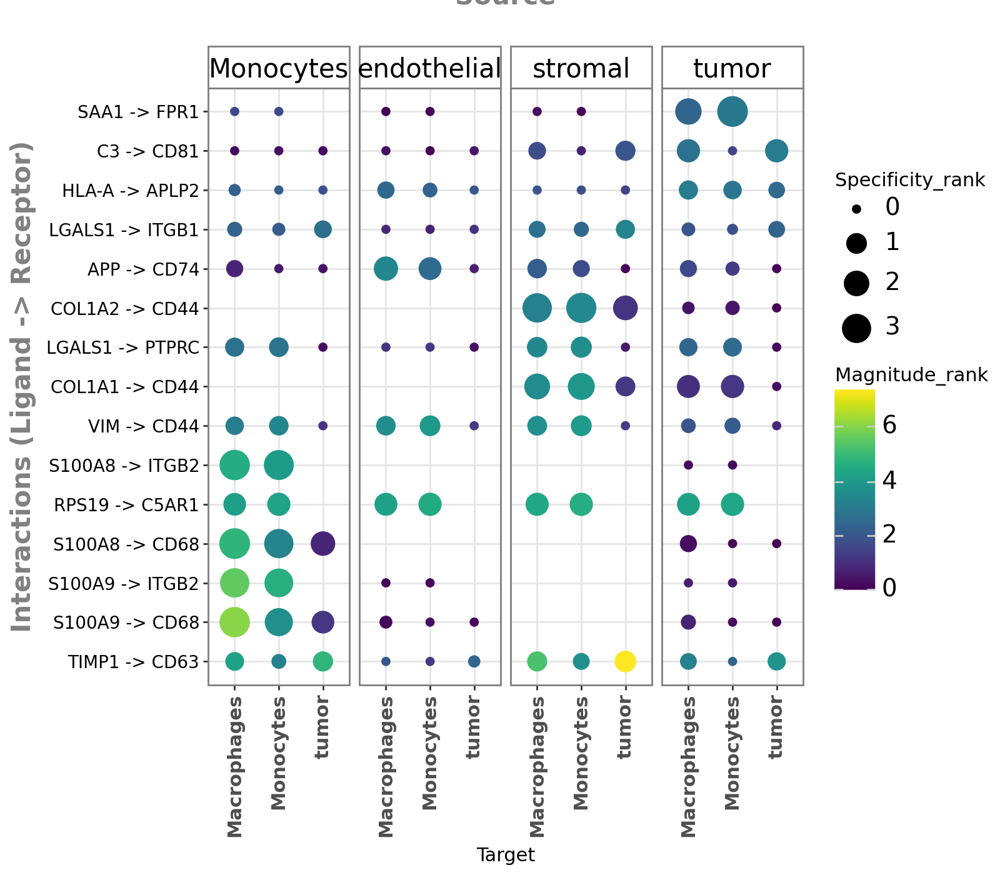

In [41]:
li.pl.dotplot(adata = adata_sc, 
              colour='magnitude_rank',
              size='specificity_rank',
              inverse_size=True,
              inverse_colour=True,
              source_labels=['stromal', 'tumor', 'endothelial', "Monocytes"],
              target_labels=['tumor', 'Macrophages', "Monocytes"],
              top_n=15, 
              orderby='magnitude_rank',
              orderby_ascending=True,
              figure_size=(8, 7)
             )

Plot spatial expression of some ligand-receptor pairs with high lrscore. Are they sptaially co-localised?

/home/yuliya.lim/.cache/tmp/ipykernel_1466049/1088037451.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.


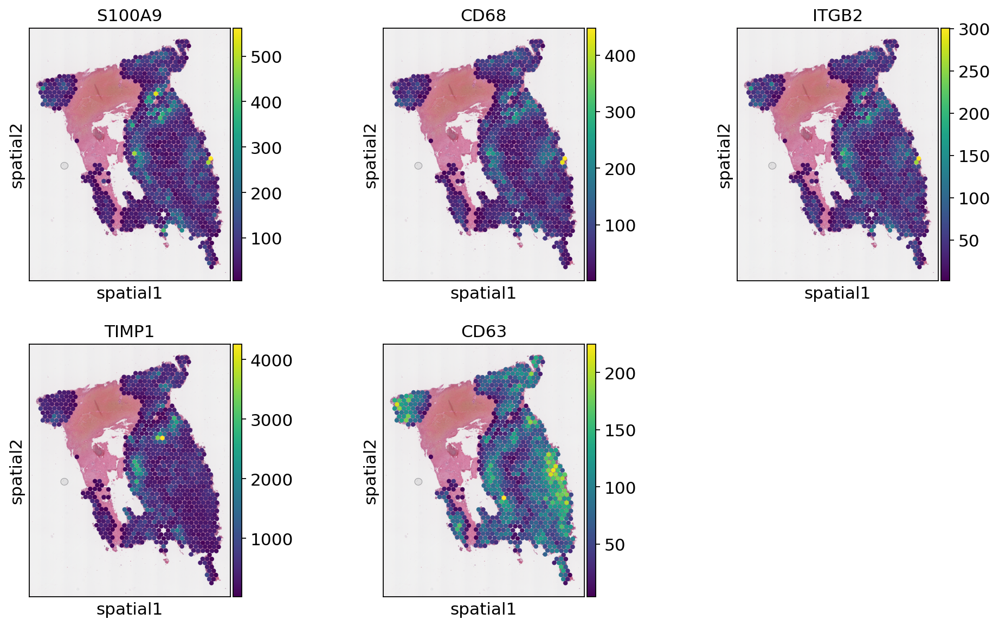

In [42]:
sc.pl.spatial(adata_st, color=["S100A9","CD68", "ITGB2", "TIMP1", "CD63"], size=1.4, ncols=3)

Plot a cell-cell interaction network with cell types in the nodes and mean score to compute the weights of the edges.

In [43]:
adata_sc.uns["liana_res"]

,source,target,ligand_complex,receptor_complex,lr_means,cellphone_pvals,expr_prod,scaled_weight,lr_logfc,spec_weight,lrscore,specificity_rank,magnitude_rank
25256,stromal,stromal,TIMP1,CD63,3.574498,0.000,12.548688,1.277407,2.220629,0.033174,0.974106,0.040722,9.816347e-09
25848,stromal,tumor,TIMP1,CD63,3.340154,0.000,10.649397,1.081198,2.102568,0.028153,0.971954,0.071619,3.926452e-08
24297,stromal,epi/mesothelial,TIMP1,CD63,3.296103,0.000,10.292382,1.044316,1.779186,0.027209,0.971486,0.080656,2.453870e-07
8365,Monocytes,Macrophages,S100A9,CD68,3.336434,0.000,9.120501,2.658659,3.960291,0.153565,0.969763,0.000418,7.949840e-07
9730,Monocytes,stromal,TIMP1,CD63,3.257155,0.000,10.583292,1.067550,1.353292,0.027978,0.971869,0.073288,9.814401e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8901,Monocytes,endothelial,MAML2,NOTCH1,0.261934,0.000,0.061974,0.554176,0.259431,0.036885,0.725556,0.119455,1.000000e+00
8873,Monocytes,endothelial,HSPA4,TLR4,0.167570,0.191,0.027927,0.100205,0.036551,0.009651,0.639601,1.000000,1.000000e+00
8871,Monocytes,endothelial,HRAS,INSR,0.257849,0.001,0.057080,0.462659,0.297139,0.022669,0.717290,0.559996,1.000000e+00
8885,Monocytes,endothelial,ITGAV,THY1,0.235529,0.000,0.054952,0.357198,0.307992,0.016035,0.713422,0.340151,1.000000e+00


<Axes: >

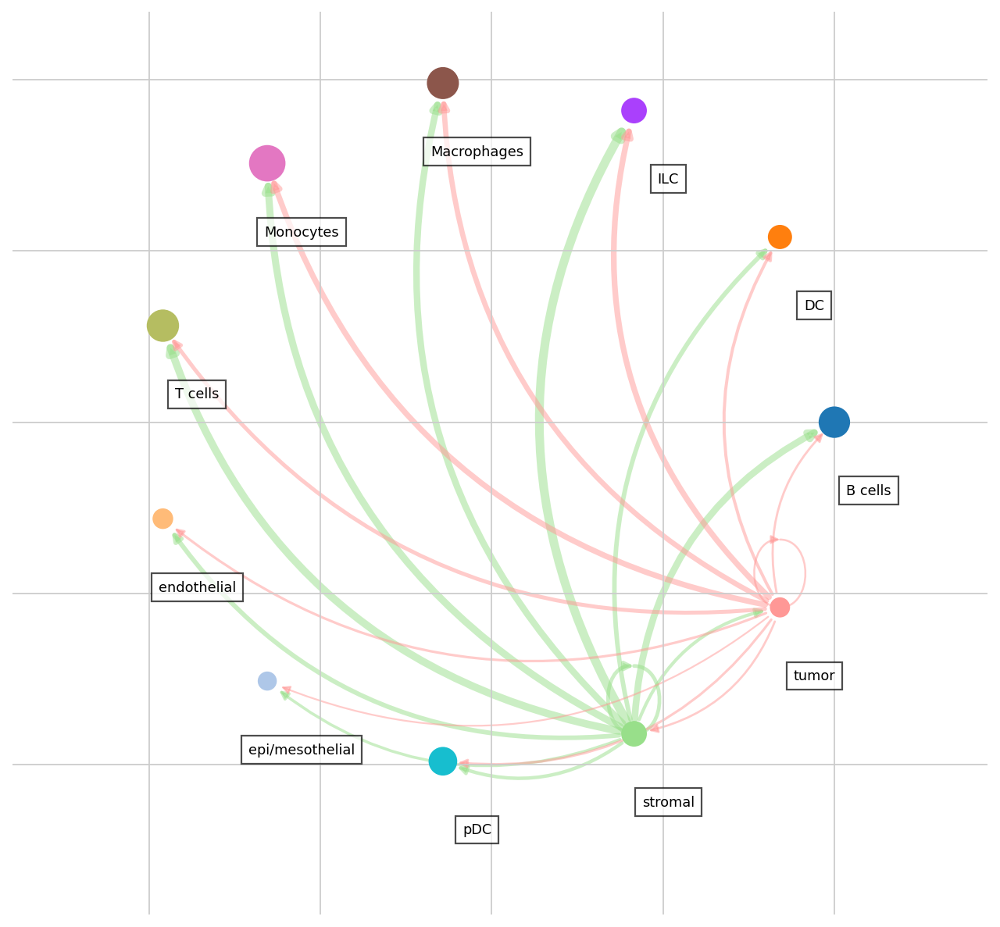

In [44]:
li.pl.circle_plot(adata_sc,
                  groupby='annotation_level2',
                  score_key='magnitude_rank',
                  inverse_score=True,
                  source_labels=['tumor', "stromal"],
                  filter_fun=lambda x: x['specificity_rank'] <= 0.05,
                  pivot_mode='mean', 
                  figure_size=(10, 10),
                  )

In [ ]:
# to visualise signalling network for one interaction (to do)

res = adata_sc.uns["liana_res"].copy()
res["interaction"] = res["ligand_complex"] + "_" + res["receptor_complex"]
adata_sc.uns["liana_res"]["interaction"] = res["ligand_complex"] + "_" + res["receptor_complex"]


li.pl.circle_plot(adata_sc,
                  groupby='annotation_level2',
                  score_key='magnitude_rank',
                  inverse_score=True,
                  liana_res=res_timp,
                  #source_labels=['tumor', "stromal"],
                  filter_fun=lambda x: x["interaction"] == "S100A9_CD68",
                  pivot_mode='count', 
                  figure_size=(10, 10),
                  )


ValueError: `pivot_mode` must be 'counts' or 'mean'!

#### 2. Infer CCI using sptaial bivariate statistics from liana module (https://liana-py.readthedocs.io/en/latest/notebooks/bivariate.html)

In [8]:
# available local functions

li.mt.bivariate.show_functions()

,name,metadata,reference
0,pearson,weighted Pearson correlation coefficient,None
1,spearman,weighted Spearman correlation coefficient,None
2,cosine,weighted Cosine similarity,None
3,jaccard,weighted Jaccard similarity,None
4,product,simple weighted product,If vars are z-scaled = Lee's static (Lee 2021;...
5,norm_product,normalized weighted product,None
6,morans,Moran's R,"Li, Z., Wang, T., Liu, P. and Huang, Y., 2022...."
7,masked_spearman,masked & weighted Spearman correlation,"Ghazanfar, S., Lin, Y., Su, X., Lin, D.M., Pat..."


Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


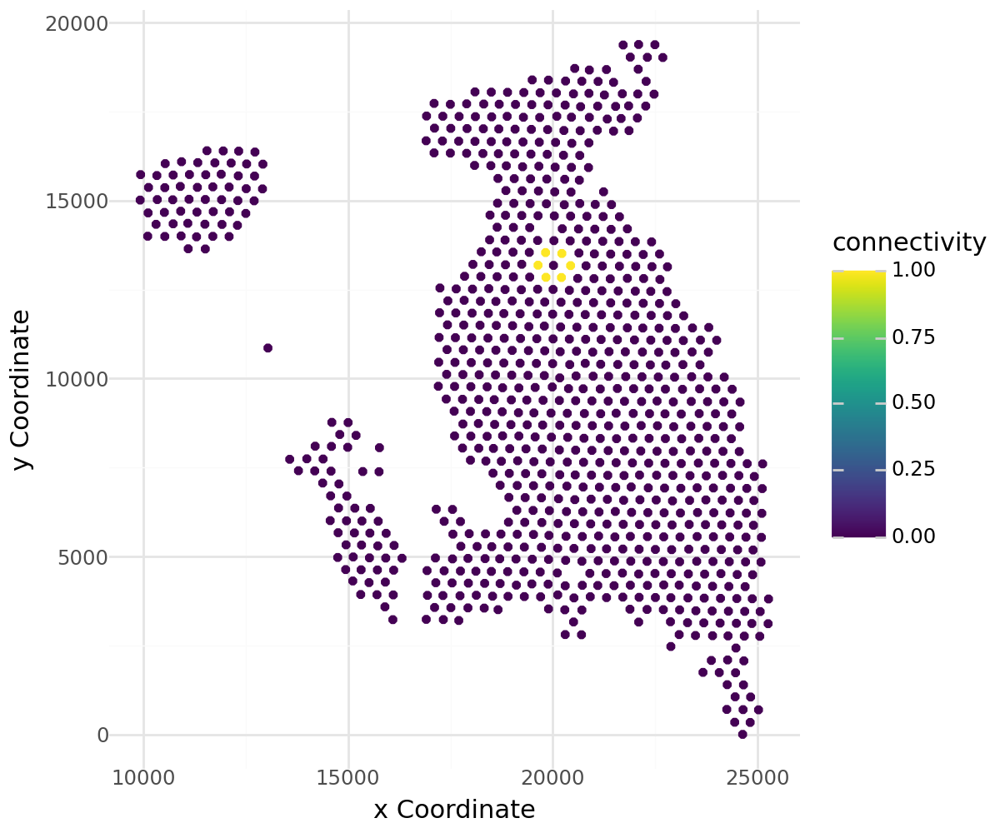

In [ ]:
# plot spatial neighbors for one spot
li.pl.connectivity(adata_st, idx=0, size=1.3, figure_size=(6, 5))


Recompute spatial connectivities with a gaussian kernel

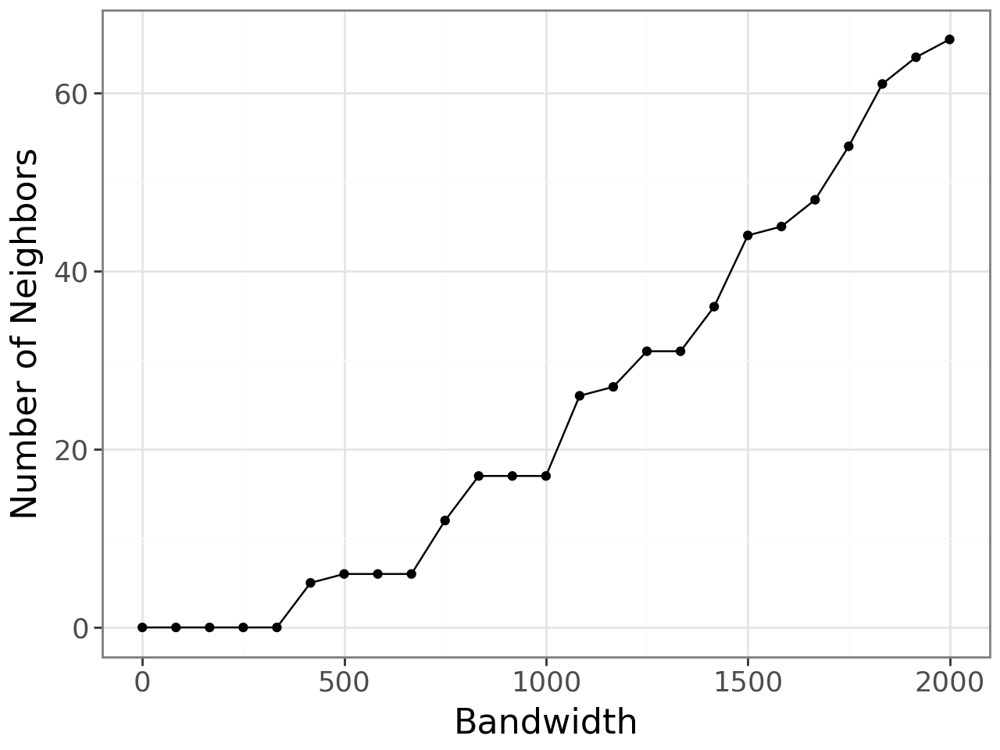

In [17]:
plot, _ = li.ut.query_bandwidth(coordinates=adata_st.obsm['spatial'], start=0, end=2000, interval_n=25)
plot

Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


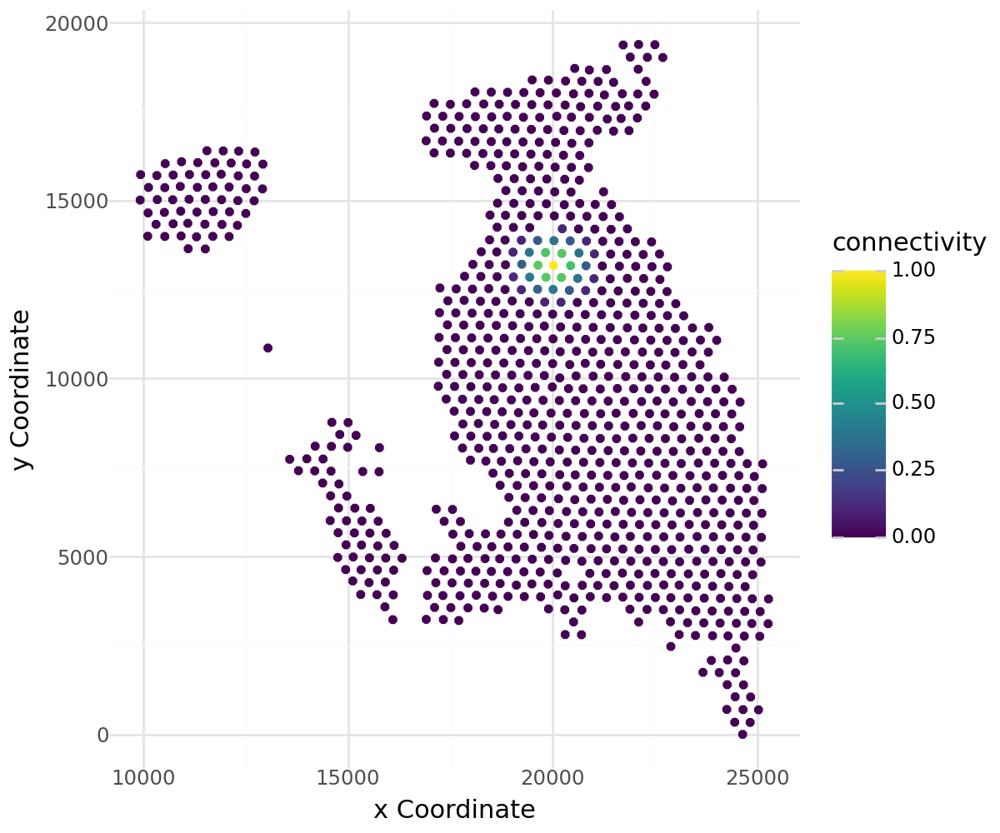

In [ ]:
li.ut.spatial_neighbors(adata_st, bandwidth=500, cutoff=0.1, kernel='gaussian', set_diag=True)
li.pl.connectivity(adata_st, idx=0, size=1.3, figure_size=(6, 5))


Run the bivariate spatial statistics computation 

In [22]:
adata_st.var_names_make_unique()


In [23]:
bivariate_out = li.mt.bivariate(adata_st,
                resource_name='cellchatDB', # NOTE: uses HUMAN gene symbols!
                local_name="cosine", # Name of the function
                global_name="morans", # Name global function
                n_perms=100, # Number of permutations to calculate a p-value
                mask_negatives=False, # Whether to mask LowLow/NegativeNegative interactions
                add_categories=True, # Whether to add local categories to the results
                nz_prop=0.1, # Minimum expr. proportion for ligands/receptors and their subunits
                use_raw=False,
                verbose=True,
                #inplace=False
                )

Using `.X`!
C:\Users\limy\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\anndata\_core\anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
3 features of mat are empty, they will be removed.
Make sure that normalized counts are passed!
Using resource `cellchatDB`.


MergeError: No common columns to perform merge on. Merge options: left_on=None, right_on=None, left_index=False, right_index=False

In [ ]:
lrdata = bivariate_out[1]
lrdata.layers["loc_scores"] = lrdata.X.copy()
lrdata.to_df(layer="loc_scores")